<a href="https://colab.research.google.com/drive/1IKmlZpdmNhDxXgIcdCQvJG2Hjn_KLddU?usp=sharing" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

By [Ibrahim Sobh](https://www.linkedin.com/in/ibrahim-sobh-phd-8681757/)

# Deep Dream: Optimize an input image (not a random image) in a way to have the recognized activations maximized (using pre-trained network). In other words, dream!

Similar to when we look at the clouds and tries to interpret shapes that we know, DeepDream also interprets and enhances the patterns it sees in an image.

![dream](https://4.bp.blogspot.com/-FPDgxlc-WPU/VYIV1bK50HI/AAAAAAAAAlw/YIwOPjoulcs/s640/skyarrow.png)

## Steps
The main idea is  to forward an image through the network, then calculate the gradient of the image w.r.t the activations of a selected layer. These activations represent what the network sees in the input image. The image is then modified to increase these activations.

By [Ibrahim Sobh](https://www.linkedin.com/in/ibrahim-sobh-phd-8681757/)

## Inception_v3

Here we use InceptionV3 network to dream.

In [1]:
import time
import numpy as np
from PIL import Image as pil_image
from keras.preprocessing import image
from keras import layers
from keras import applications
from keras.applications import inception_v3
from keras.applications.inception_v3 import preprocess_input, decode_predictions
from keras import backend as K
import matplotlib.pyplot as plt
import imageio
from tqdm import tqdm_notebook as tqdm

Using TensorFlow backend.


In [0]:
def deprocess_inceptionv3(img):
  img = (255.0*(img + 1.0)/2.0).astype('uint8')
  return img

In [3]:
# build the VGG16 network
model = applications.InceptionV3(include_top=True, weights='imagenet')  # Pre-trained network

# get the symbolic outputs of each "key" layer.
layer_dict = dict([(layer.name, layer) for layer in model.layers])

for layer in model.layers:
  print(layer.name)

96116736/96112376 [==============================] - 4s 0us/step
input_1
conv2d_1
batch_normalization_1
activation_1
conv2d_2
batch_normalization_2
activation_2
conv2d_3
batch_normalization_3
activation_3
max_pooling2d_1
conv2d_4
batch_normalization_4
activation_4
conv2d_5
batch_normalization_5
activation_5
max_pooling2d_2
conv2d_9
batch_normalization_9
activation_9
conv2d_7
conv2d_10
batch_normalization_7
batch_normalization_10
activation_7
activation_10
average_pooling2d_1
conv2d_6
conv2d_8
conv2d_11
conv2d_12
batch_normalization_6
batch_normalization_8
batch_normalization_11
batch_normalization_12
activation_6
activation_8
activation_11
activation_12
mixed0
conv2d_16
batch_normalization_16
activation_16
conv2d_14
conv2d_17
batch_normalization_14
batch_normalization_17
activation_14
activation_17
average_pooling2d_2
conv2d_13
conv2d_15
conv2d_18
conv2d_19
batch_normalization_13
batch_normalization_15
batch_normalization_18
batch_normalization_19
activation_13
activation_15
activation

2020-05-10 20:21:10 URL:https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg [83281/83281] -> "ex01.jpg" [1]


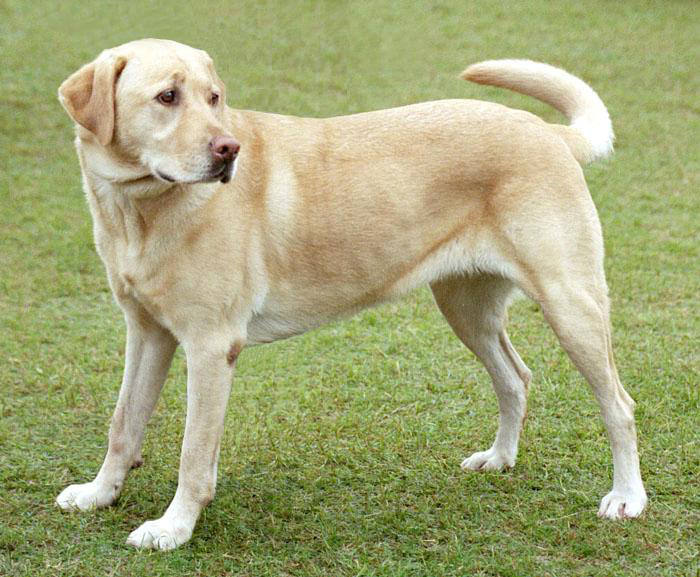

In [4]:
# load an image to dearm on
!wget -nv https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg -O ex01.jpg

img = pil_image.open('./ex01.jpg')
img

In [5]:
img_path = './ex01.jpg'
img = image.load_img(img_path, target_size=(299, 299))
x = image.img_to_array(img)
print('image.img_to_array: ', x.shape, np.max(x), np.min(x))
x = np.expand_dims(x, axis=0)
print('expand_dims: ', x.shape, np.max(x), np.min(x))
x = preprocess_input(x)
print('preprocess_input: ', x.shape, np.max(x), np.min(x))

image.img_to_array:  (299, 299, 3) 255.0 0.0
expand_dims:  (1, 299, 299, 3) 255.0 0.0
preprocess_input:  (1, 299, 299, 3) 1.0 -1.0


In [6]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

40960/35363 [==================================] - 0s 0us/step
Predicted: [('n02099712', 'Labrador_retriever', 0.31319314), ('n02108422', 'bull_mastiff', 0.04985559), ('n02099849', 'Chesapeake_Bay_retriever', 0.030752154)]


In [0]:
layers_dream =  ['mixed3', 'mixed5']
coffs_dream =  [1.0, 1.5]

loss = K.variable(0.)
for i in range(len(layers_dream)):
  loss = loss + K.mean(coffs_dream[i] * (layer_dict[layers_dream[i]].output))  # can add more layers

In [0]:
# compute the gradient of the input picture wrt this loss
grads = K.gradients(loss, model.input)[0]

# normalization trick: we normalize the gradient
grads /= K.std(grads) + 1e-8

# this function returns the loss and grads given the input picture
iterate = K.function([model.input], [loss, grads])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


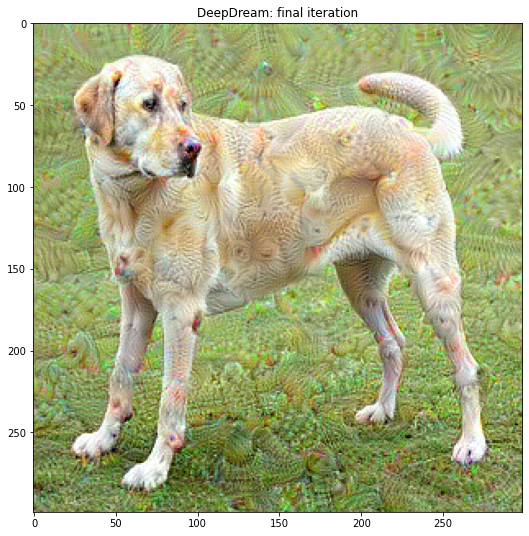

In [9]:
# run gradient for n steps
images = []

dream_x = x.copy()

loss_list = []
for i in tqdm(range(500)):
    loss_value, grads_value = iterate([dream_x])
    loss_list.append(loss_value)

    dream_x += grads_value * 0.001
    dream_x = np.clip(dream_x, -1.0, 1.0)
    
    if(i%5 == 0):
      img = dream_x[0]
      img = deprocess_inceptionv3(img)
      images.append(img)


img = dream_x[0]
img = deprocess_inceptionv3(img)
images.append(img)
plt.figure(figsize=(9,9))
plt.title('DeepDream: final iteration')
plt.imshow(img)

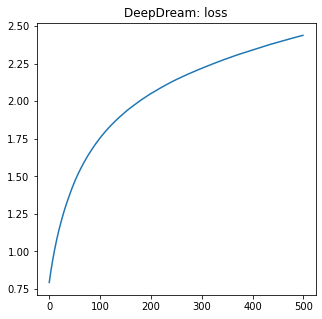

In [10]:
plt.figure(figsize=(5,5))
plt.title('DeepDream: loss')
plt.plot(loss_list)

In [0]:
imageio.mimsave('./DeepDream.gif', images)

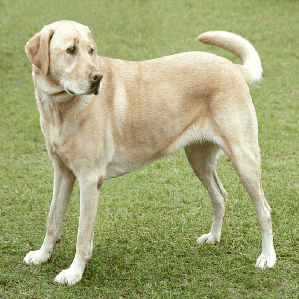

In [12]:
from IPython.display import Image
with open('./DeepDream.gif','rb') as f:
    display(Image(data=f.read(), format='png'))